In [7]:
%pylab inline

import numpy as np, mahotas
import cv2
from io import BytesIO
from ipywidgets import interact, interactive, fixed
from scipy import fftpack
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import math
from PIL import Image
from PIL import ImageEnhance
from PIL import ImageOps
import scipy
from scipy import ndimage
import skimage
from skimage import filters, feature
import gdal
import osgeo

Populating the interactive namespace from numpy and matplotlib


E:\Anaconda3\lib\site-packages\IPython\core\magics\pylab.py:160: UserWarning: pylab import has clobbered these variables: ['fftpack', 'interactive']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [8]:
def read_image(path):
    tci = []
    rgb = []
    jp2s = []
    for (dirpath, dirnames, filenames) in walk(path):
        jp2s = filenames
        break
    for jp2 in jp2s:
        if 'TCI' in jp2:
            nir_ds = gdal.Open(path + "/" + jp2)
            nir_band = nir_ds.GetRasterBand(1)
            nir = nir_band.ReadAsArray()
            tci = nir
    return  tci, np.array(rgb)

tci = read_image('1.jp2')

In [ ]:
from PIL import Image
   
def crop(image_path, coords, n):
    """
    @param image_path: The path to the image to edit
    @param coords: A tuple of x/y coordinates (x1, y1, x2, y2)
    @param saved_location: Path to save the cropped image
    """
    image_obj = Image.open(image_path)
    cropped_image = image_obj.crop(coords)
    location = "cropped%d.jpg" % n
    cropped_image.save(location)
    cropped_image.show()
    
image = 'img1.png'
x=0;
y=0;
    
for i in range (1,3):
    for j in range(1,5):
        crop(image, (x, y, x+M/5, y+N/3), j*i)
        x =  x+M/5
        j = j+1
    i = i+1
    y = y+N/3

In [ ]:
def crop(image_path, coords, saved_location):
    """
    @param image_path: The path to the image to edit
    @param coords: A tuple of x/y coordinates (x1, y1, x2, y2)
    @param saved_location: Path to save the cropped image
    """
    image_obj = Image.open(image_path)
    cropped_image = image_obj.crop(coords)
    cropped_image.save(saved_location)
 
 
if __name__ == '__main__':
    image = 'img1.png'
    crop(image, (0, 0, 2196, 3660), 'imagens/cropped1.jpg')
    crop(image, (2196, 0, 4392, 3660), 'imagens/cropped2.jpg')
    crop(image, (4392, 0, 6588, 3660), 'imagens/cropped3.jpg')
    crop(image, (6588, 0, 8784, 3660), 'imagens/cropped4.jpg')
    crop(image, (8784, 0, 10980, 3660), 'imagens/cropped5.jpg')
    
    crop(image, (0, 3660, 2196, 7320), 'imagens/cropped6.jpg')
    crop(image, (2196, 3660, 4392, 7320), 'imagens/cropped7.jpg')
    crop(image, (4392, 3660, 6588, 7320), 'imagens/cropped8.jpg')
    crop(image, (6588, 3660, 8784, 7320), 'imagens/cropped9.jpg')
    crop(image, (8784, 3660, 10980, 7320), 'imagens/cropped10.jpg')
    
    crop(image, (0, 7320, 2196, 10980), 'imagens/cropped11.jpg')
    crop(image, (2196, 7320, 4392, 10980), 'imagens/cropped12.jpg')
    crop(image, (4392, 7320, 6588, 10980), 'imagens/cropped13.jpg')
    crop(image, (6588, 7320, 8784, 10980), 'imagens/cropped14.jpg')
    crop(image, (8784, 7320, 10980, 10980), 'imagens/cropped15.jpg')

In [9]:
def estradas(img, detalhes=0):
    img1 = np.uint8(img)
    # Aplicação do filtro de canny à imagem original que já vem previamente trabalhada em termos de contraste 
    f_canny = skimage.feature.canny(img, sigma=3)
    
    # Aplicação da morfologia matemática de dilatação ao resultado da utilização de Canny
    dil_bin_f_canny = ndimage.morphology.binary_dilation(f_canny)
    
    if(detalhes==1):
        gray()
        _, ax = subplots(1,2,figsize = (15,30))
        ax[0].imshow(img)
        ax[0].set_title("Imagem Original com Contraste 100")
        ax[1].imshow(dil_bin_f_canny)
        ax[1].set_title("Canny")

<Figure size 432x288 with 0 Axes>

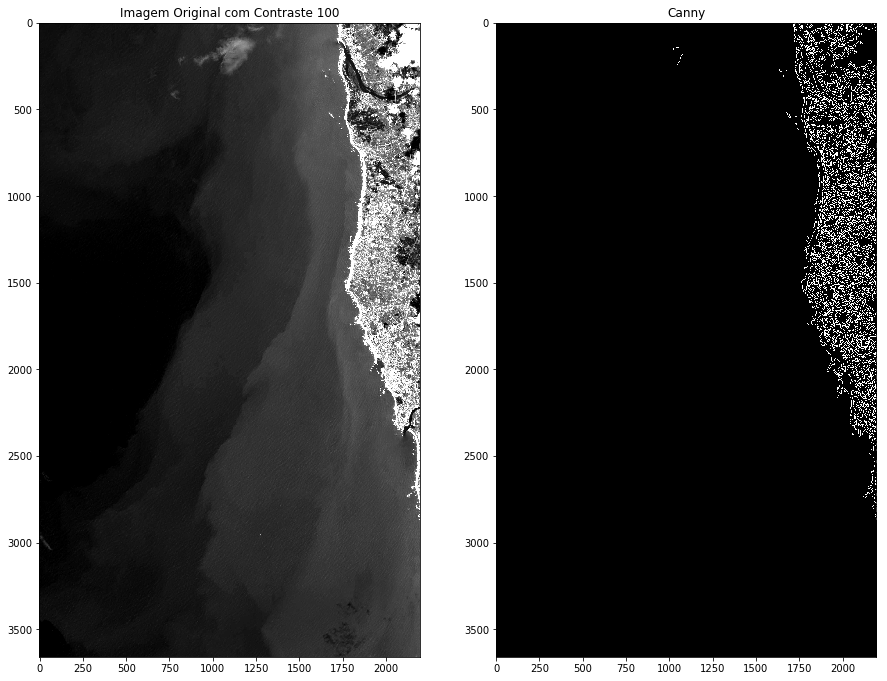

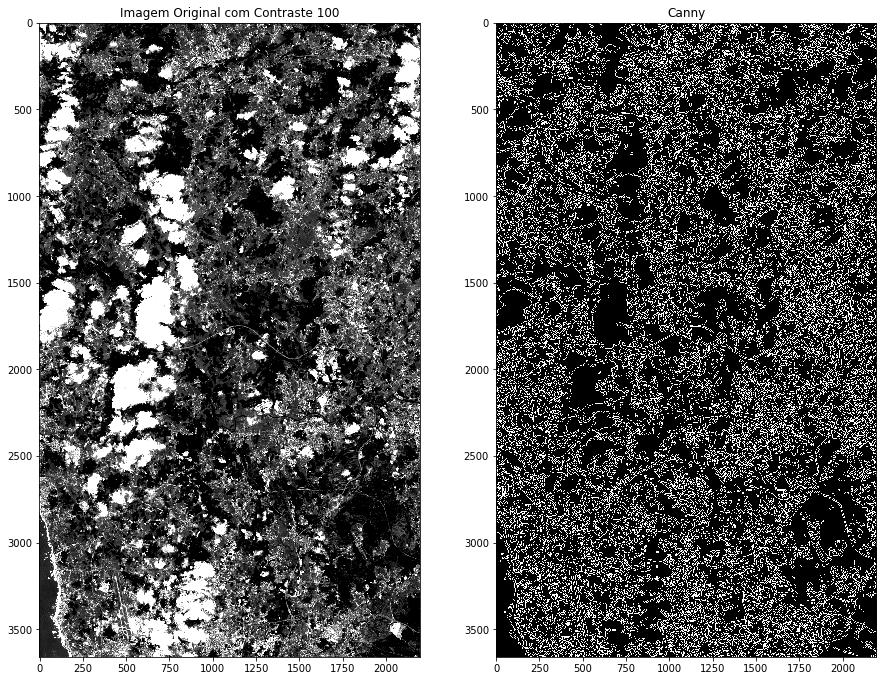

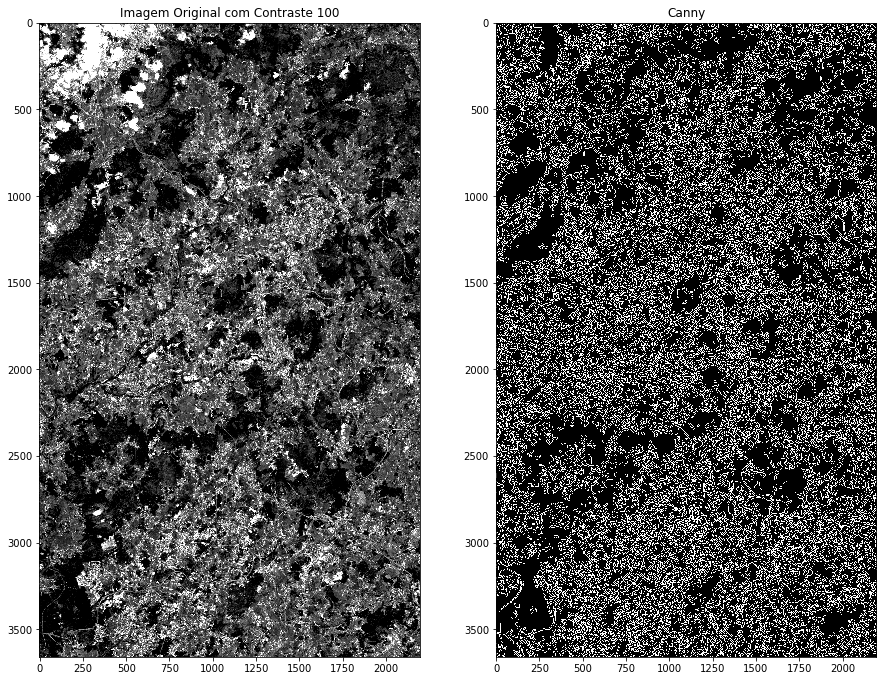

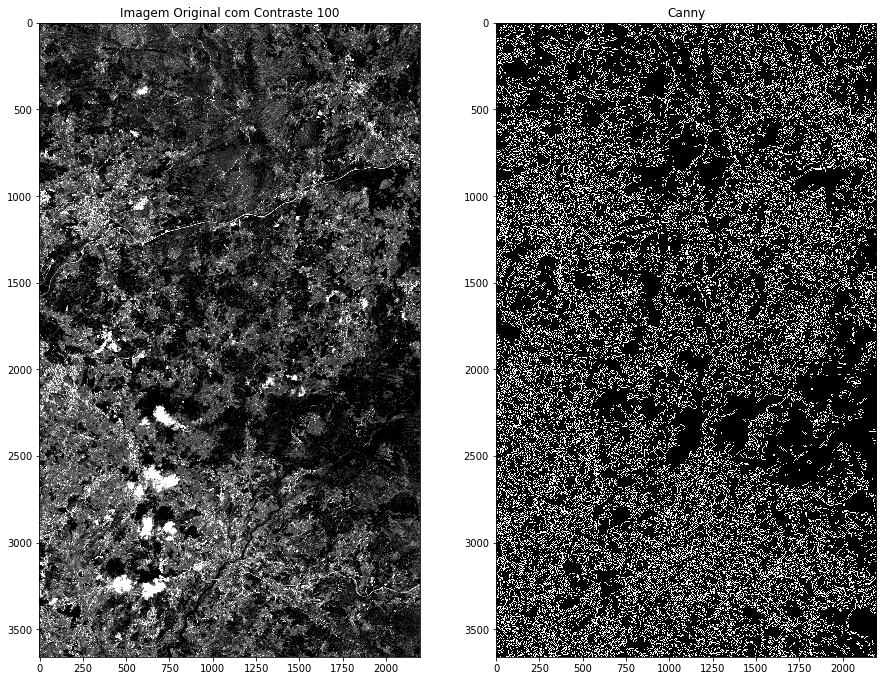

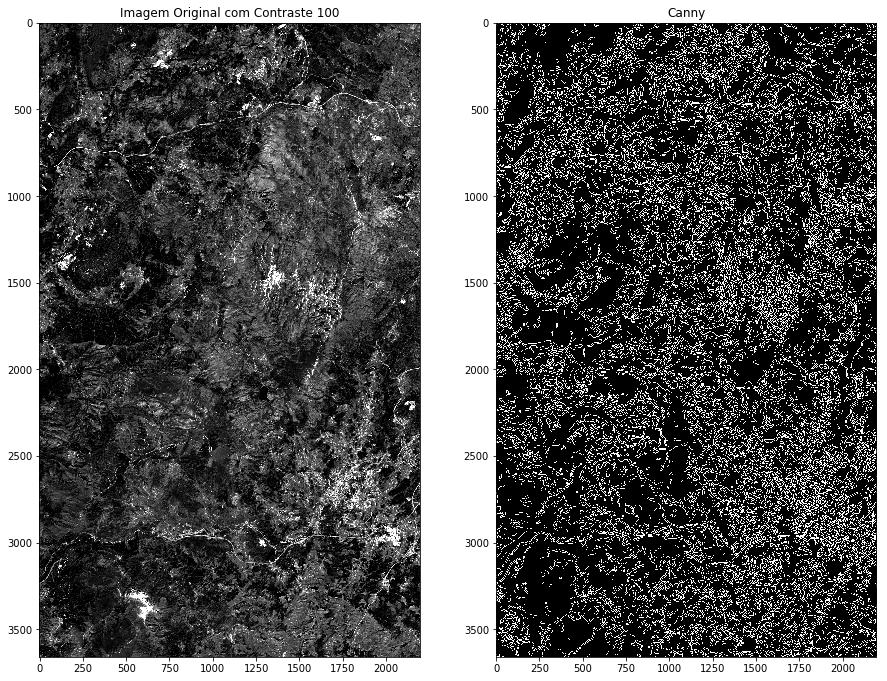

...

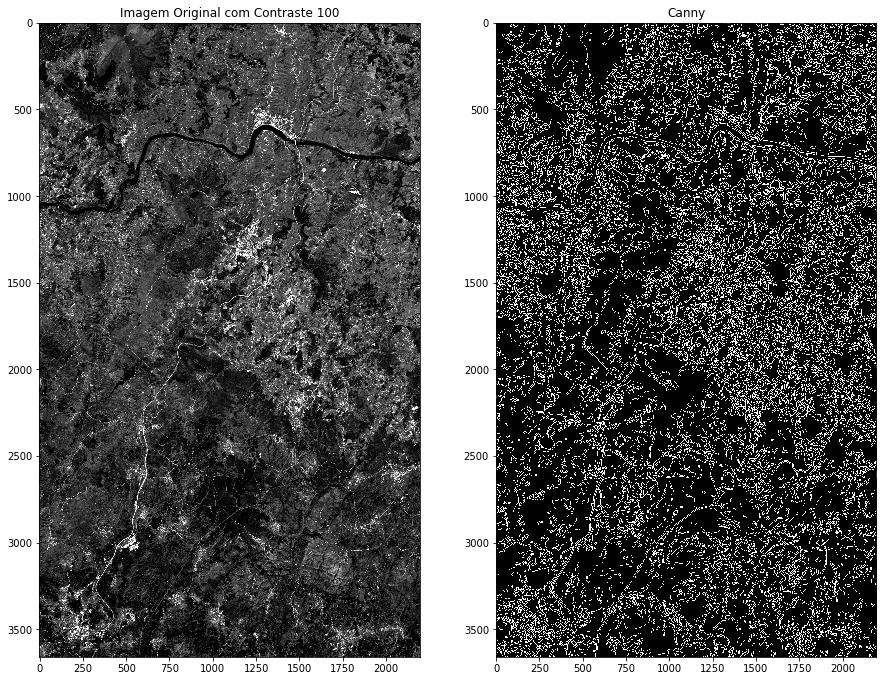

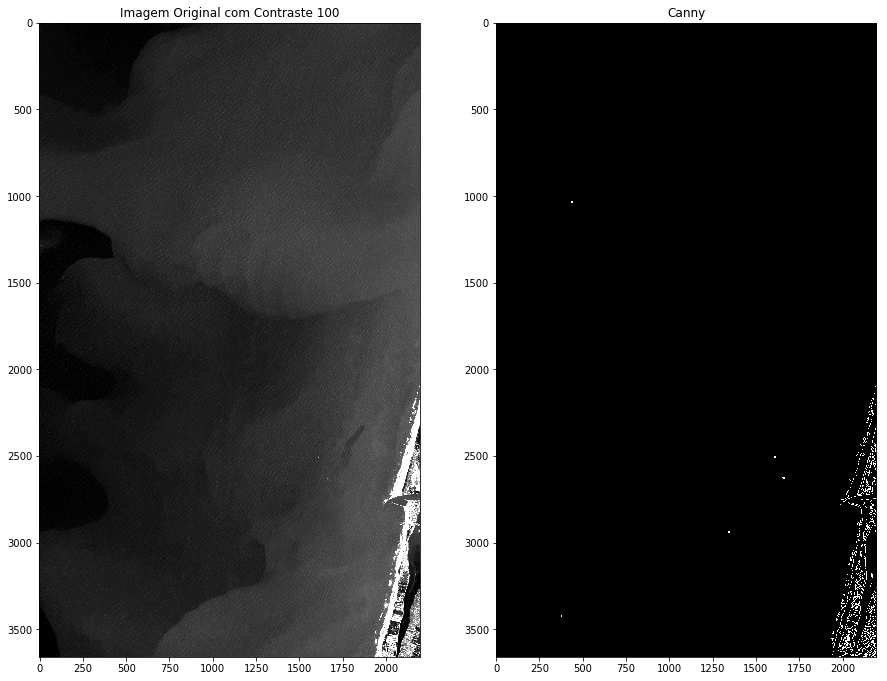

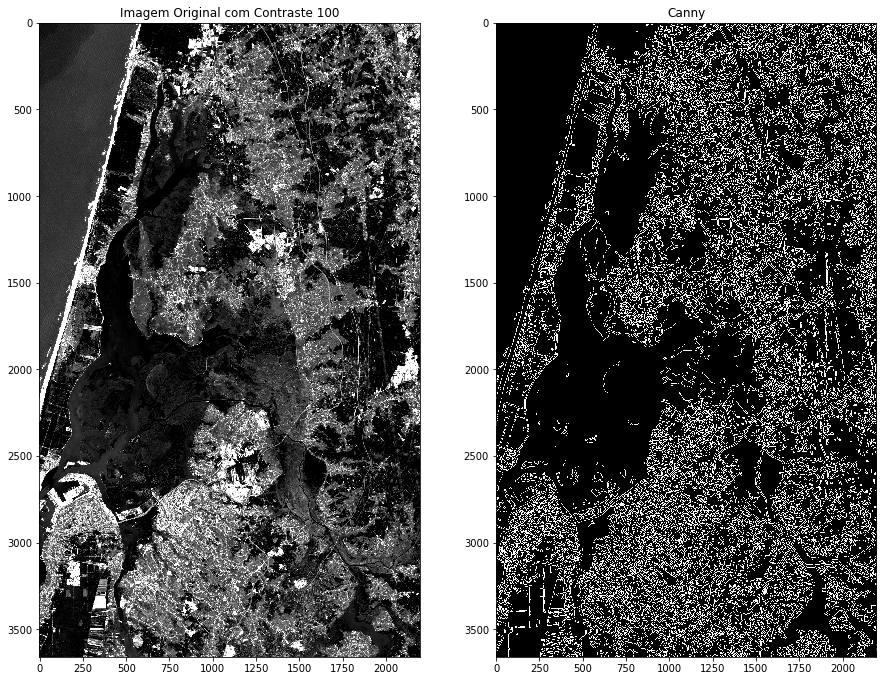

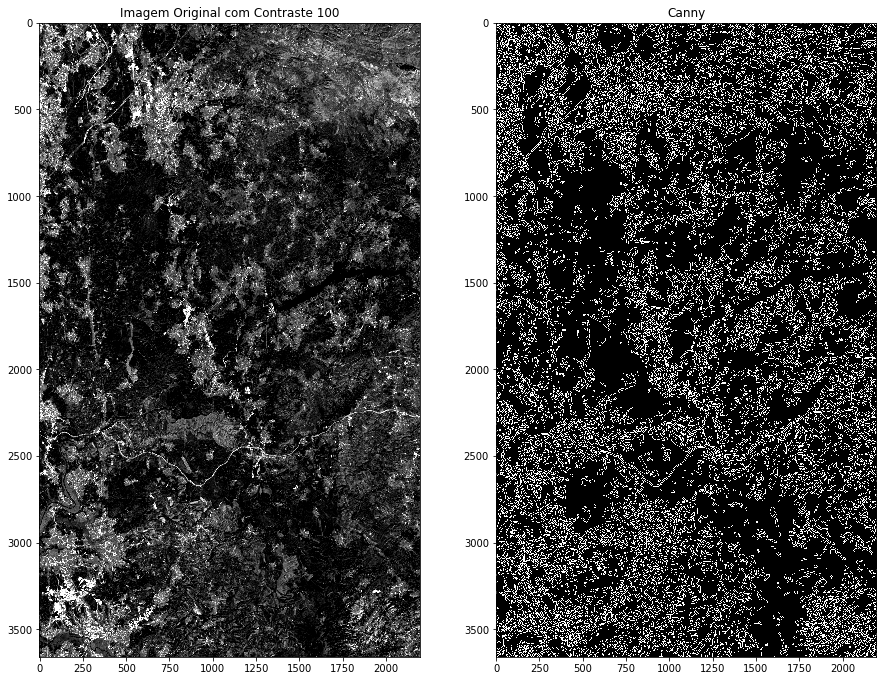

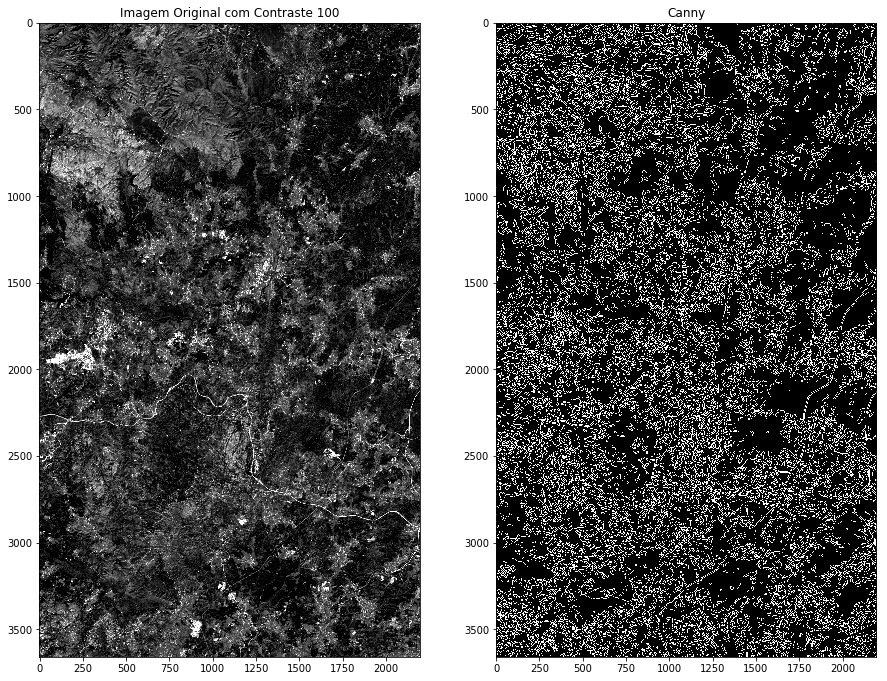

In [10]:
for i in range(1,15):

    image = imread('cropped%d.jpg' % i)
    img_original = (image[:,:,1])

    def adjust_contrast(input_image, output_image, factor):
        image = Image.open(input_image)
        enhancer_object = ImageEnhance.Contrast(image)
        out = enhancer_object.enhance(factor)
        out.save(output_image)

    if __name__ == '__main__':
        adjust_contrast('cropped%d.jpg' % i,
                        'more_contrast%d.png' % i,
                        2)


    i2 = imread('more_contrast%d.png' % i)
    img_teste = (i2[:,:,1])    
    
    estradas(img_teste, 1)